In [1]:
# THIS NOTEBOOK VISUALIZES THE RESULTS OF THE CNN AUTOENCODER TRAINED ON 32by32 RESOLUTION DATASET

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import os
import numpy as np
from data_loader import DataLoader
from utils.visualize import show_images_in_grid, show_reconstructions
from utils.unsupervised_tools import *
from cnn import Autoencoder
import random
import pandas as pd
import plotly.express as px

Using TensorFlow backend.
/home/abhi/anaconda3/envs/envTF113/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/abhi/anaconda3/envs/envTF113/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/abhi/anaconda3/envs/envTF113/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/abhi/anaconda3

In [4]:
root = os.getcwd()

In [5]:
cnn_data_loader = DataLoader()

In [6]:
cnn_data_loader.X_train = np.reshape(np.load(root+"/../datasets/train/32/X_train_normalized.npy"), (-1, 32, 32, 3))
cnn_data_loader.Y_train = np.reshape(np.load(root+"/../datasets/train/32/Y_train_normalized.npy"), (-1, 32, 32, 3))
cnn_data_loader.X_val = np.reshape(np.load(root+"/../datasets/val/32/X_val_normalized.npy"), (-1, 32, 32, 3))
cnn_data_loader.Y_val = np.reshape(np.load(root+"/../datasets/val/32/Y_val_normalized.npy"), (-1, 32, 32, 3))
cnn_data_loader.X_test = np.reshape(np.load(root+"/../datasets/test/32/X_test_normalized.npy"), (-1, 32, 32, 3))
cnn_data_loader.Y_test = np.reshape(np.load(root+"/../datasets/test/32/Y_test_normalized.npy"), (-1, 32, 32, 3))

In [7]:
cnn_data_loader.X_train.shape, cnn_data_loader.X_val.shape, cnn_data_loader.X_test.shape

((16000, 32, 32, 3), (2000, 32, 32, 3), (2000, 32, 32, 3))

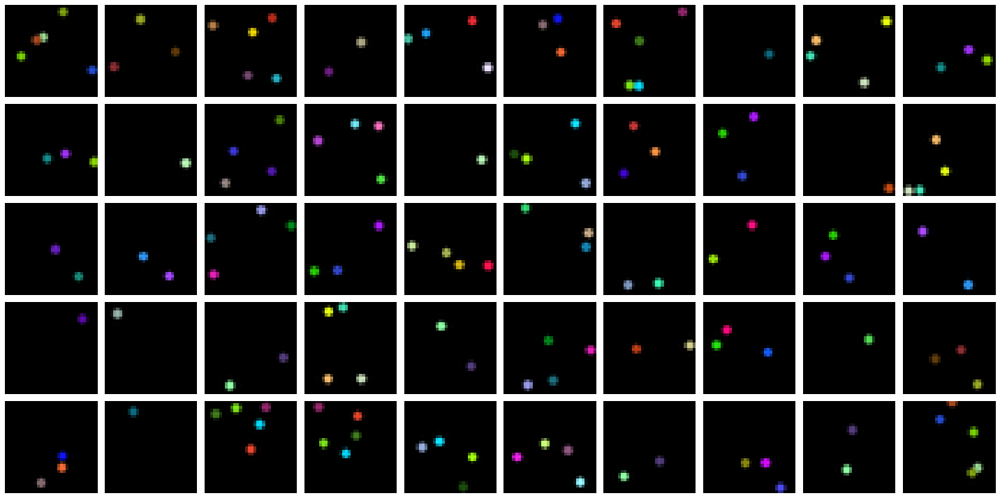

In [8]:
show_images_in_grid(images=cnn_data_loader.X_train, columns=10, rows=5, img_size=(50,50), plot_size=(20,10), rescale=True)

In [9]:
ae = Autoencoder()
ae.build_model(input_dim=(32, 32, 3), latent_dim=(64,))
ae.set_weights(root+"/../models/autoencoder_32_v3.h5")

Instructions for updating:
Colocations handled automatically by placer.


In [10]:
ae.encoder.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 64)        3136      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 64)          65600     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 64)          65600     
_________________________________________________________________
flatten_1 (Flatten)          (None, 4096)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                262208    
Total params: 396,544
Trainable params: 396,544
Non-trainable params: 0
_____________________________________________________

In [11]:
ae.decoder.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 192)               12480     
_________________________________________________________________
reshape_1 (Reshape)          (None, 8, 8, 3)           0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 64)        3136      
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 32, 32, 64)        65600     
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 32, 32, 64)        65600     
_________________________________________________________________
flatten_2 (Flatten)          (None, 65536)             0   

In [12]:
Y_train_hat = ae.autoencoder.predict(cnn_data_loader.X_train)
Y_val_hat = ae.autoencoder.predict(cnn_data_loader.X_val)
Y_test_hat = ae.autoencoder.predict(cnn_data_loader.X_test)

In [13]:
# TRAIN

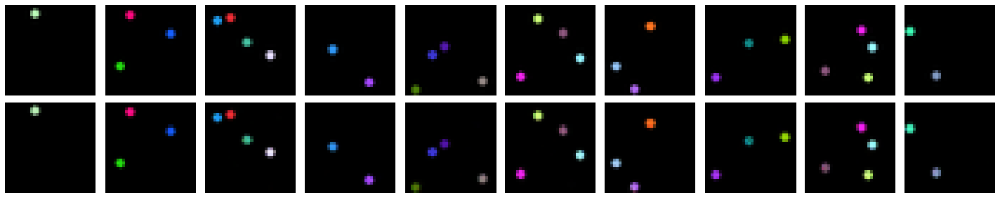

In [16]:
show_reconstructions(cnn_data_loader.Y_train, Y_train_hat, 10, (50,50), (20,4), rescale=True)

In [15]:
# VALIDATION

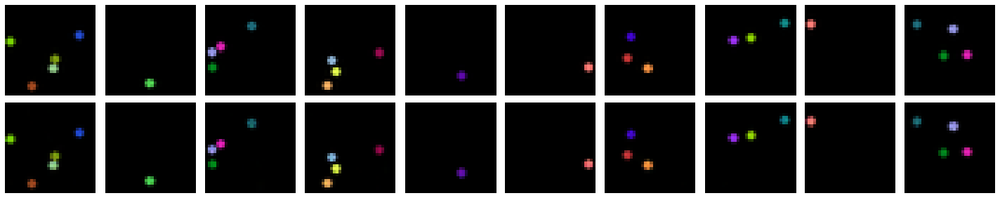

In [16]:
show_reconstructions(cnn_data_loader.Y_val, Y_val_hat, 10, (50,50), (20,4), rescale=True)

In [17]:
# TEST

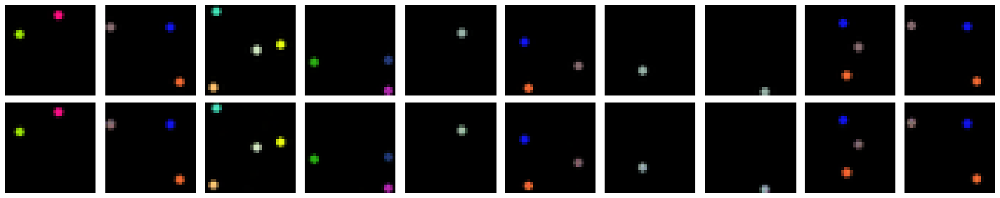

In [18]:
show_reconstructions(cnn_data_loader.Y_test, Y_test_hat, 10, (50,50), (20,4), rescale=True)

In [14]:
# WE WILL NOW VISUALIZE THE LATENT SPACE WITH PCA. EACH LATENT SAMPLE WILL HAVE A LABEL
# (THE NUMBER OF BALLS IN THE FRAME)

In [15]:
datasets = {}
embeddings = {}

In [16]:
for i in range(1,5+1):
    path = root+"/../datasets/data/32/"+str(i)+"_normalized.npy"
    datasets[i] = np.reshape(np.load(path)[:, :100, :, :, :], (-1, 32, 32, 3))
    embeddings[i] = ae.encoder.predict(datasets[i])

In [17]:
labels = []
datasets[0] = datasets[1]
embeddings[0] = embeddings[1]
labels += [1]*embeddings[1].shape[0]
n = 5
for i in range(2, n+1):
    if i in [2,3,4,5]:
        embeddings[0] = np.concatenate((embeddings[0], embeddings[i]))
        datasets[0] = np.concatenate((datasets[0], datasets[i]))
        labels += [i]*embeddings[i].shape[0]
labels = np.array(labels)

In [18]:
X_prime = pca(embeddings[0], components=3) 

In [19]:
X_visual=np.concatenate((X_prime, np.reshape(labels, (labels.shape[0], 1))), axis=1)

In [20]:
df = pd.DataFrame(data=X_visual,
                      index=[i for i in range(X_visual.shape[0])],
                      columns=["x"+str(i) for i in range(X_visual.shape[1])])

In [21]:
fig = px.scatter_3d(df, x='x0', y='x1', z='x2', color='x3')
fig.show()

In [27]:
# LET'S JUST PLOT THE MEANS OF EACH CLUSTER (i.e. MEAN OF THE PCA EMBEDDING FOR N=# OF BALLS)

In [28]:
centers = []
for i in range(0, 4+1):
    centers.append(np.concatenate((np.mean(X_visual[i*4000:(i+1)*4000, 0:3], axis=0), np.array([i+1]))))
centers = np.array(centers)

In [29]:
df = pd.DataFrame(data=centers,
                      index=[i for i in range(centers.shape[0])],
                      columns=["x"+str(i) for i in range(centers.shape[1])])

In [30]:
fig = px.scatter_3d(df, x='x0', y='x1', z='x2', color='x3')
fig.show()

In [22]:
X_prime = pca(np.reshape(datasets[0], (-1, 32*32*3)), components=3) 

In [23]:
X_visual=np.concatenate((X_prime, np.reshape(labels, (labels.shape[0], 1))), axis=1)

In [24]:
df = pd.DataFrame(data=X_visual,
                      index=[i for i in range(X_visual.shape[0])],
                      columns=["x"+str(i) for i in range(X_visual.shape[1])])

In [25]:
fig = px.scatter_3d(df, x='x0', y='x1', z='x2', color='x3')
fig.show()